In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import statistics
from time import time
from decimal import Decimal
from scipy.signal import find_peaks
from scipy.optimize import curve_fit

In [2]:
### import TRAINING LT ref bubbles
tic = time()

rb_signals = pd.read_excel('./Training/all_bubbles/ref_bubbles_ATData.xlsx')
rb_bubble_detect = pd.read_excel('./Training/all_bubbles/ref_bubbles_BubbleDetectTime.xlsx')

toc = time()
print(f"Done in {toc - tic:.3f}s")

Done in 27.788s


In [17]:
### import TRAINING FG ref bubbles
tic = time()

rb_signals = pd.read_excel('./Training/FG_bubbles/FG_ref_bubbles_ATData.xlsx')
rb_bubble_detect = pd.read_excel('./Training/FG_bubbles/FG_ref_bubbles_BubbleDetectTime.xlsx')

toc = time()
print(f"Done in {toc - tic:.3f}s")

Done in 5.786s


In [2]:
### import TESTING ref bubbles
tic = time()

rb_signals = pd.read_excel('./Testing/ref_bubbles/ref_bubbles_ATData.xlsx')
rb_bubble_detect = pd.read_excel('./Testing/ref_bubbles/ref_bubbles_BubbleDetectTime.xlsx')

toc = time()
print(f"Done in {toc - tic:.3f}s")

Done in 3.674s


In [3]:
class Test:
    def __init__(self, ID, BubbleDetectTime, P4, P5, A4):
        self.ID = ID
        self.BubbleDetectTime = BubbleDetectTime
        self.P4 = P4 # potassium
        self.P5 = P5 # calcium
        self.A4 = A4 # crea
        
    # function to offset t = 0
    def offset_time(self):
        # using Decimal due to rounding error
        t_0 = Decimal(str(self.BubbleDetectTime + 30))
        t_step = Decimal(str(0.2))
        start_idx = round(t_0/t_step) - 1
                
        self.P4 = self.P4[start_idx:]
        self.P5 = self.P5[start_idx:]
        self.A4 = self.A4[start_idx:]
        
    # function to trim NaNs
    def trim_NaNs(self):
        # making sure list is not empty
        while len(self.P4) > 0 and math.isnan(self.P4[-1]):
            self.P4.pop()
                
        while len(self.P5) > 0 and math.isnan(self.P5[-1]):
            self.P5.pop()
        
        while len(self.A4) > 0 and math.isnan(self.A4[-1]):
            self.A4.pop()

In [4]:
def create_test_list(signals, bubble_detect_time):
    # separating channels
    group_channels = signals.groupby('Channel')
    channel_dfs = {}

    # iterating over the groups and creating a new dataframe for each group
    for channel, group in group_channels:
        df = pd.DataFrame(group.iloc[:, 2:])
        channel_dfs[channel] = df

    # creating test objects
    tests = []
    for i in range(0, len(bubble_detect_time)):
        ID = bubble_detect_time.iloc[i, 0]
        BubbleDetectTime = bubble_detect_time.iloc[i, 1]
        P4 = channel_dfs['P4'].iloc[i, :].values.tolist()
        P5 = channel_dfs['P5'].iloc[i, :].values.tolist()
        A4 = channel_dfs['A4'].iloc[i, :].values.tolist()

        new_test = Test(ID, BubbleDetectTime, P4, P5, A4)
        tests.append(new_test)
    
    return tests

In [5]:
### making test objects 
rb_tests = create_test_list(rb_signals, rb_bubble_detect)

### offset and trim all tests
for test in rb_tests: 
    test.offset_time()
    test.trim_NaNs()

In [7]:
"""
# checking for empty tests
for test in rb_tests:
    if len(test.P4) == 0:
        print(test.ID)
"""

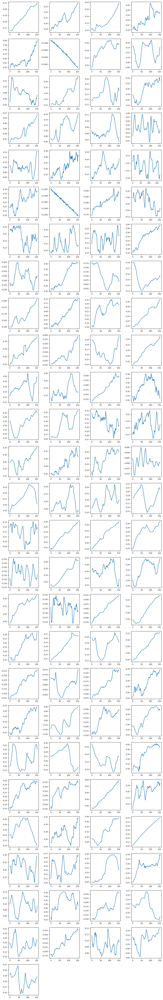

In [19]:
"""### plot for sanity check
i = 0
j = len(rb_tests) - 1

# calculate grid dimensions
n_plots = len(rb_tests[i:j])
n_cols = 4
n_rows = int(np.ceil(n_plots/n_cols))

# create the figure and subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))

# flatten the subplots array to make it easier to index
axs = axs.ravel()

# loop over the plots and generate them
for idx, test in enumerate(rb_tests[i:j]):
    axs[idx].plot(test.P4)
    axs[idx].tick_params(axis='both', which='major', labelsize=8)

# hide any unused subplots
for i in range(n_plots, n_rows*n_cols):
    axs[i].axis('off')

# show the plots
plt.tight_layout()
plt.show()"""

In [23]:
"""def flag_peaks(tests):
    test_peaks = []

    for test in tests:
        # captures ref failures at end of signal
        # note: width=(100, 1400) also optimizes accuracy with 99.4% and 98.5%
        peaks, _ = find_peaks(-1*np.array(test.P4), width=10)
        
        if len(peaks) == 0:
            # check for ref failure at start of signal
            peaks, _ = find_peaks(np.array(test.P4), width=10) 
        
        # peaks = np.concatenate((peaks_1, peaks_2)) # this might be wrong??? why is it a tuple. but if you look at the plots all the peaks are found

        test_peaks.append(peaks)
        
    return test_peaks"""

In [26]:
def flag_peaks(tests):
    test_peaks = []
    
    for test in tests:
        peaks_1, _ = find_peaks(-1 * np.array(test.P4))

        # checking for peaks
        peaks_2, _ = find_peaks(np.array(test.P4))

        # merging valleys and peaks
        peaks = np.concatenate((peaks_1, peaks_2))
        
        test_peaks.append(peaks)
        
    return test_peaks

In [8]:
"""# separating ref bubbles into flagged and non-flagged tests
rb_flag_idx = []
rb_pass_idx = []

for idx, peaks in enumerate(rb_peaks):
    # print(f"Index: {idx}, Peaks: {peaks}, Length: {len(peaks)}")
    if len(peaks) == 0:
        rb_pass_idx.append(idx)
        # print("pass")
    else:
        rb_flag_idx.append(idx)
        # print("fail")"""

In [27]:
### finding peaks in ref bubbles
rb_peaks = flag_peaks(rb_tests)

In [25]:
"""print(len(rb_tests))
print(len(rb_peaks))
print(rb_pass_idx)
print(rb_flag_idx)"""

106
106
[91]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105]


In [10]:
"""# removing mislabelled tests (FOR LT ONLY)
rb_tests_mislabelled = [6, 24, 33, 34, 112, 137]

rb_pass_idx = [idx for idx in rb_pass_idx if idx not in rb_tests_mislabelled]
rb_flag_idx = [idx for idx in rb_flag_idx if idx not in rb_tests_mislabelled]"""

NameError: name 'rb_pass_idx' is not defined

In [11]:
def plot_waveforms(target_indices, tests, test_peaks, channel):
    n_plots = len(target_indices)
    
    # calculate grid dimensions
    n_cols = 4
    n_rows = int(np.ceil(n_plots/n_cols))
    
    # create the figure and subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))

    # flatten the subplots array to make it easier to index
    axs = axs.ravel()
    
    # loop over the plots and generate them
    for axs_num, idx in enumerate(target_indices):
        waveform = np.array(getattr(tests[idx], channel))
        peaks = test_peaks[idx]
        
        # plotting waveforms with peaks
        axs[axs_num].plot(waveform)
        axs[axs_num].plot(peaks, waveform[peaks], "x")
        axs[axs_num].tick_params(axis='both', which='major', labelsize=8)

    # hide any unused subplots
    for i in range(n_plots, n_rows*n_cols):
        axs[i].axis('off')

    # show the plots
    plt.tight_layout()
    plt.show()

"""# temp for plotting ref bubbles without peaks
def plot_waveforms(target_indices, tests, channel):
    n_plots = len(target_indices)
    
    # calculate grid dimensions
    n_cols = 4
    n_rows = int(np.ceil(n_plots/n_cols))
    
    # create the figure and subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))

    # flatten the subplots array to make it easier to index
    axs = axs.ravel()
    
    # loop over the plots and generate them
    for axs_num, idx in enumerate(target_indices):
        waveform = np.array(getattr(tests[idx], channel))
        
        # plotting waveforms with peaks
        axs[axs_num].plot(waveform)
        axs[axs_num].tick_params(axis='both', which='major', labelsize=8)

    # hide any unused subplots
    for i in range(n_plots, n_rows*n_cols):
        axs[i].axis('off')

    # show the plots
    plt.tight_layout()
    plt.show()"""
    
"""def plot_channel_diff(target_indices, tests):
    n_plots = len(target_indices)
    
    # calculate grid dimensions
    n_cols = 4
    n_rows = int(np.ceil(n_plots/n_cols))
    
    # create the figure and subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))

    # flatten the subplots array to make it easier to index
    axs = axs.ravel()
    
    # loop over the plots and generate them
    for axs_num, idx in enumerate(target_indices):
        P4_array = np.array(tests[idx].P4)
        P5_array = np.array(tests[idx].P5)
        channel_diff = [x - y for x, y in zip(P4_array, P5_array)]
        
        # plotting waveforms with peaks
        axs[axs_num].plot(channel_diff)
        axs[axs_num].tick_params(axis='both', which='major', labelsize=8)

    # hide any unused subplots
    for i in range(n_plots, n_rows*n_cols):
        axs[i].axis('off')

    # show the plots
    plt.tight_layout()
    plt.show()
    
def compute_noise(target_indices, tests):
    std = []
    
    for idx in target_indices:
        P4_array = np.array(tests[idx].P4)
        P5_array = np.array(tests[idx].P5)
        channel_diff = [x - y for x, y in zip(P4_array, P5_array)]
        
        std.append(np.std(channel_diff))
    
    return std"""

"def plot_channel_diff(target_indices, tests):\n    n_plots = len(target_indices)\n    \n    # calculate grid dimensions\n    n_cols = 4\n    n_rows = int(np.ceil(n_plots/n_cols))\n    \n    # create the figure and subplots\n    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))\n\n    # flatten the subplots array to make it easier to index\n    axs = axs.ravel()\n    \n    # loop over the plots and generate them\n    for axs_num, idx in enumerate(target_indices):\n        P4_array = np.array(tests[idx].P4)\n        P5_array = np.array(tests[idx].P5)\n        channel_diff = [x - y for x, y in zip(P4_array, P5_array)]\n        \n        # plotting waveforms with peaks\n        axs[axs_num].plot(channel_diff)\n        axs[axs_num].tick_params(axis='both', which='major', labelsize=8)\n\n    # hide any unused subplots\n    for i in range(n_plots, n_rows*n_cols):\n        axs[i].axis('off')\n\n    # show the plots\n    plt.tight_layout()\n    plt.show()\n    \ndef compute_no

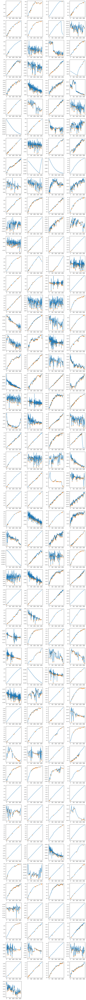

In [25]:
# plotting all tests in group
target_indices = list(range(len(rb_tests))) # all
plot_waveforms(target_indices, rb_tests, rb_peaks, "P4")

In [16]:
target_lists = []
for idx, peak_list in enumerate(rb_peaks):
    if 0 < len(peak_list) < 3:
        target_lists.append(idx)
        
plot_waveforms(target_lists, rb_tests, rb_peaks, "P4")

ValueError: Number of rows must be a positive integer, not 0

<Figure size 1000x0 with 0 Axes>

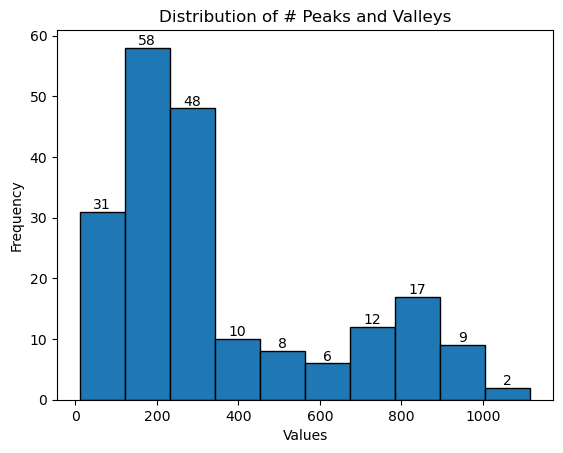

In [28]:
# checking distribution of # of peaks
len_peaks = [len(peaks) for peaks in rb_peaks]

# bin_edges = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
    
# plotting distribution of # of peaks
counts, edges, bars = plt.hist(len_peaks, bins='auto', edgecolor='black')

# add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.bar_label(bars)
plt.title('Distribution of # Peaks and Valleys')

# show the plot
plt.show()

# note that bins are inclusive of their lower bound and exclusive of their upper bound, 
# with the exception of the N+1 (last) bin which is inclusive of both bounds.

In [23]:
len_peaks.sort()
print(len_peaks)

[0, 3, 5, 6, 7, 8, 9, 10, 11, 11, 11, 12, 12, 12, 12, 13, 13, 14, 14, 15, 15, 16, 17, 17, 18, 19, 20, 20, 20, 21, 21, 22, 22, 22, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 25, 25, 26, 26, 26, 26, 26, 27, 28, 29, 29, 29, 29, 29, 30, 31, 31, 32, 32, 32, 32, 33, 34, 35, 36, 37, 38, 39, 39, 39, 39, 39, 40, 40, 40, 41, 41, 42, 42, 42, 42, 42, 43, 43, 44, 44, 45, 47, 48, 48, 48, 49, 49, 50, 51, 55, 57, 59, 61, 72, 89, 93]


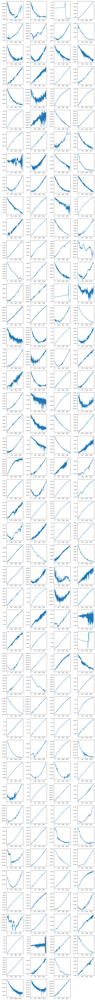

In [30]:
# plotting differences between channel waveforms
plot_channel_diff(rb_flag_idx, rb_tests)

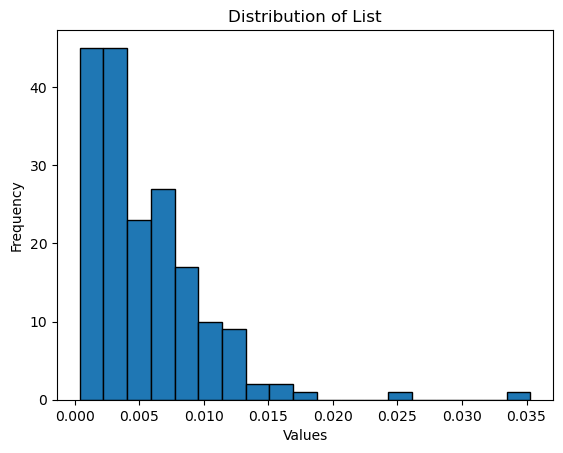

In [35]:
# evaluating noisiness of channel difference signals
std = compute_noise(rb_flag_idx, rb_tests)

# plotting distribution of std
plt.hist(std, bins='auto', edgecolor='black')

# add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Distribution of List')

# show the plot
plt.show()

In [41]:
"""
# grabbing indices of mislabelled tests
sub_idx = [12, 18, 61, 77]
sub_idx = [idx-1 for idx in sub_idx]

mislabelled_idx = []
for idx in sub_idx:
    mislabelled_idx.append(rb_pass_idx[idx])
    
print(mislabelled_idx)

for idx in rb_tests_mislabelled:
    print(rb_tests[idx].ID)
"""

9925278
9976872
10017313
10017528
10413109
10834433


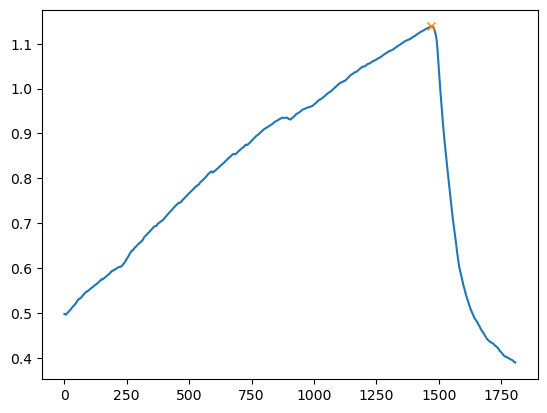

[1468]
1
[1468]
1


In [40]:
"""
# investigating individual samples
test_idx = 6
sample = rb_tests[test_idx]
    
# check for peaks and/or valleys
P4_array = np.array(sample.P4)
peaks = rb_peaks[test_idx]
plt.plot(P4_array)
plt.plot(peaks, P4_array[peaks], "x")
plt.show()

print(peaks)
print(len(peaks))

print(rb_peaks[test_idx])
print(len(rb_peaks[test_idx]))
"""

In [7]:
### simulating pipeline filtering for normal vs ref failure classification
print(len(rb_tests))
mislabelled_IDs = [9976872,10017528,10413109,10834433,10017313]

# cleaning up
to_remove = []
for _, test in enumerate(rb_tests):
    # relabelling mislabelled tests
    if test.ID in mislabelled_IDs:
        to_remove.append(test)
        
rb_tests = [test for test in rb_tests if test not in to_remove]
print(len(rb_tests))

# finding peaks in ref failures
rb_peaks = flag_peaks(rb_tests)

targets = []
for idx, peak_list in enumerate(rb_peaks):
    if (0 < len(peak_list) <= 5):
        targets.append(idx)
        
print(len(targets))

201
196
35


In [8]:
# define the polynomial function to fit
def func(x, a, b, c, d, e, f):
    return a*x**5 + b*x**4 + c*x**3 + d*x**2 + e*x + f


# fit error to polynomial curve
def fit_poly(idx, tests):
    y = tests[idx].P4

    start_time = 0.2
    end_time = 0.2*len(y)
    num_steps = round((end_time - start_time)/0.2) + 1

    x = np.linspace(start_time, end_time, num_steps)

    # perform the curve fit
    popt, _ = curve_fit(func, x, y)
    y_fit = func(x, *popt) # unpacks tuple into the 6 coefficients rather than passing an array

    return x, y, y_fit, popt # ADDED POPT TO SEE COEFFICIENTS


# define the linear function to fit
def lin_func(x, a, b):
    return a*x + b


# fit data to linear curve for one test
def fit_lin(idx, tests):
    y = tests[idx].P4

    start_time = 0.2
    end_time = 0.2*len(y)
    num_steps = round((end_time - start_time)/0.2) + 1

    x = np.linspace(start_time, end_time, num_steps)

    # perform the curve fit
    popt, _ = curve_fit(lin_func, x, y)
    y_fit = lin_func(x, *popt) # unpacks tuple into the 2 coefficients rather than passing an array

    return x, y, y_fit, popt


def plot_fit(x_list, y_list, y_fit_list):
    n_plots = len(x_list)
    
    # calculate grid dimensions
    n_cols = 4
    n_rows = int(np.ceil(n_plots/n_cols))
    
    # create the figure and subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 2.25*n_rows))

    # flatten the subplots array to make it easier to index
    axs = axs.ravel()
    
    # loop over the plots and generate them
    for idx, (x, y, y_fit) in enumerate(zip(x_list, y_list, y_fit_list)):
        axs[idx].scatter(x, y, marker='o', s=0.05, label='Data')
        axs[idx].plot(x, y_fit, color='red', label='Fit')
        axs[idx].tick_params(axis='both', which='major', labelsize=8)
        
    # hide any unused subplots
    for i in range(n_plots, n_rows*n_cols):
        axs[i].axis('off')

    # show the plots
    plt.tight_layout()
    plt.show()
    
    
def compute_residuals(y, y_fit):
    residuals = y - y_fit
    
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)
        
    return r_squared

In [24]:
### fitting ref bubbles to polynomial/linear functions
x_list = []
y_list = []
y_fit_list = []
coef_list = []

for idx in targets: # SWITCH AS NEEDED
    x, y, y_fit, coef = fit_lin(idx, rb_tests)
    x_list.append(x)
    y_list.append(y)
    y_fit_list.append(y_fit)
    coef_list.append(coef)

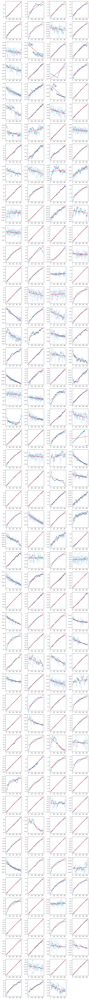

In [12]:
### plotting ref bubbles with fit functions
plot_fit(x_list, y_list, y_fit_list)

R-squared: 0.2457
R-squared: 0.6622
R-squared: 0.9503
R-squared: 0.9504
R-squared: 0.9538
R-squared: 0.9546
R-squared: 0.9646
R-squared: 0.9653
R-squared: 0.9674
R-squared: 0.9726
R-squared: 0.9844
R-squared: 0.9951
R-squared: 0.9961
R-squared: 0.9964
R-squared: 0.9969
R-squared: 0.9980
R-squared: 0.9981
R-squared: 0.9984
R-squared: 0.9985
R-squared: 0.9985
R-squared: 0.9985
R-squared: 0.9986
R-squared: 0.9988
R-squared: 0.9988
R-squared: 0.9989
R-squared: 0.9991
R-squared: 0.9991
R-squared: 0.9991
R-squared: 0.9991
R-squared: 0.9991
R-squared: 0.9993
R-squared: 0.9994
R-squared: 0.9996
R-squared: 0.9996
R-squared: 0.9997


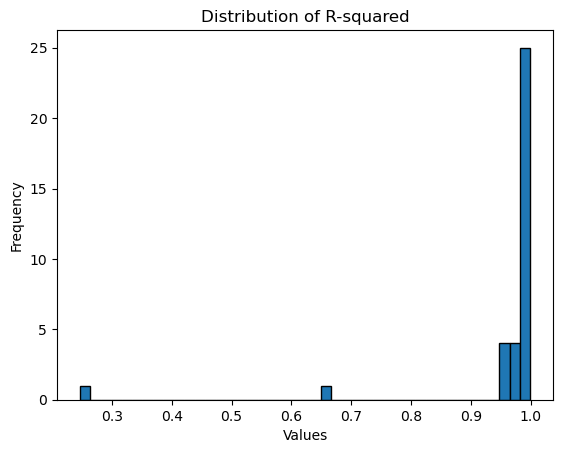

In [25]:
### computing R-squared values to evaluate fit
rs_list = []

for y, y_fit in zip(y_list, y_fit_list):
    rs_list.append(compute_residuals(y, y_fit))
    
rs_list.sort() # DO NOT SORT ON FIRST RUN

for r_squared in rs_list:
    print(f"R-squared: {r_squared:.4f}")

# plotting distribution of R-squared
plt.hist(rs_list, bins='auto', edgecolor='black')

# add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Distribution of R-squared')

# show the plot
plt.show()

In [26]:
limit = []
for rs in rs_list:
    if rs > 0.9500:
        limit.append(rs)
        
print(len(limit))
print(len(rs_list))

33
35


In [27]:
print(np.mean(rs_list))
print(np.median(rs_list))

0.9581187052487394
0.9984410476088595


In [28]:
# calculating median absolute deviation
median = np.median(rs_list)
MAD = np.median(np.abs(rs_list - median))
print(MAD)

0.0012022625334737747


In [31]:
# for samples failing the threshold, how far are they from median R-squared?
# and how close are they to the threshold?
median = np.median(rs_list)
dist_med = []
# dist_threshold = []
for rs in rs_list:
    if rs > 0.9500:
        dist_med.append(rs - median)
        # dist_threshold.append(rs - 0.9975)

# mean_deviation = np.mean(deviations)
# print(mean_deviation)

median_dist_med = np.median(dist_med)
print(median_dist_med)

# median_dist_threshold = np.median(dist_threshold)
# print(median_dist_threshold)

2.4888557603297556e-05


In [26]:
"""### REF BUBBLE DETECTION idk wtf this is everything beyond this point is probably useless
rb_pass_remove = []

for idx, r_squared in enumerate(rs_list):
    if r_squared < 0.98:
        rb_pass_remove.append(idx)
        
# removing elements at these indices from x_list, y_list, y_fit_list
x_list = [item for idx, item in enumerate(x_list) if idx not in rb_pass_remove]
y_list = [item for idx, item in enumerate(y_list) if idx not in rb_pass_remove]
y_fit_list = [item for idx, item in enumerate(y_fit_list) if idx not in rb_pass_remove]
coef_list = [item for idx, item in enumerate(coef_list) if idx not in rb_pass_remove]

# removing indices from rb_pass_idx
rb_pass_idx = [item for idx, item in enumerate(rb_pass_idx) if idx not in rb_pass_remove]"""

In [30]:
"""# define the LINEAR FUNCTION to fit
def lin_func(x, a, b):
    return a*x + b


# fit error to LINEAR FUNCTION
def fit_lin(idx, tests):
    y = tests[idx].P4

    start_time = 0.2
    end_time = 0.2*len(y)
    num_steps = int((end_time - start_time)/0.2) + 1

    x = np.linspace(start_time, end_time, num_steps)

    # perform the curve fit
    popt, _ = curve_fit(lin_func, x, y)
    y_fit = lin_func(x, *popt) # unpacks tuple into the 2 coefficients rather than passing an array

    return x, y, y_fit, popt # ADDED POPT TO SEE COEFFICIENTS"""

In [85]:
"""### fitting filtered ref bubbles to linear functions
x_list = []
y_list = []
y_fit_list = []
coef_list = []

for idx in rb_flag_idx:
    x, y, y_fit, coef = fit_lin(idx, rb_tests)
    x_list.append(x)
    y_list.append(y)
    y_fit_list.append(y_fit)
    coef_list.append(coef)"""

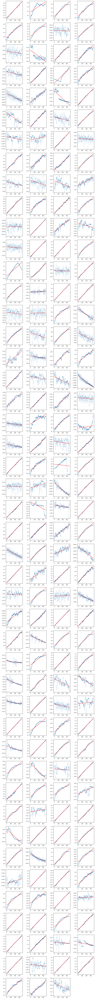

In [86]:
### plotting ref bubbles with fit functions (LITERALLY A COPY OF ABOVE JUST HERE FOR CONVENIENCE)
plot_fit(x_list, y_list, y_fit_list)

In [13]:
### computing R-squared values to evaluate fit (LITERALLY A COPY OF ABOVE JUST HERE FOR CONVENIENCE)
rs_list = []

for y, y_fit in zip(y_list, y_fit_list):
    rs_list.append(compute_residuals(y, y_fit))
    
rs_list.sort()

for r_squared in rs_list:
    print(f"R-squared: {r_squared:.4f}")

R-squared: 0.0004
R-squared: 0.0020
R-squared: 0.0026
R-squared: 0.0081
R-squared: 0.0094
R-squared: 0.0142
R-squared: 0.0145
R-squared: 0.0194
R-squared: 0.0196
R-squared: 0.0223
R-squared: 0.0227
R-squared: 0.0282
R-squared: 0.0383
R-squared: 0.0408
R-squared: 0.0411
R-squared: 0.0455
R-squared: 0.0546
R-squared: 0.0553
R-squared: 0.0561
R-squared: 0.0592
R-squared: 0.0865
R-squared: 0.0895
R-squared: 0.0919
R-squared: 0.1005
R-squared: 0.1015
R-squared: 0.1342
R-squared: 0.1491
R-squared: 0.1653
R-squared: 0.2018
R-squared: 0.2159
R-squared: 0.2170
R-squared: 0.2277
R-squared: 0.2727
R-squared: 0.2909
R-squared: 0.2927
R-squared: 0.2984
R-squared: 0.3143
R-squared: 0.3455
R-squared: 0.3499
R-squared: 0.3667
R-squared: 0.3691
R-squared: 0.3732
R-squared: 0.4500
R-squared: 0.4761
R-squared: 0.5024
R-squared: 0.5854
R-squared: 0.6008
R-squared: 0.6203
R-squared: 0.6271
R-squared: 0.6327
R-squared: 0.6361
R-squared: 0.6509
R-squared: 0.6548
R-squared: 0.6622
R-squared: 0.6961
R-squared:

In [32]:
for coef in coef_list:
    print(coef)

[0.00187211 0.27803481]
[0.00521799 0.92364446]
[0.00093671 0.13687978]
[0.00149429 0.35761745]
[0.003488   0.61585329]
[0.00231704 0.1910689 ]
[0.00304757 0.26437437]
[0.00332346 0.29989069]
[0.00163708 0.2110846 ]
[0.00197754 0.16741748]
[0.00303908 0.22186432]
[0.00075324 0.28033379]
[0.00319912 0.57206435]
[0.00189947 0.29595007]
[0.00071289 0.28864068]
[0.00283305 0.36530661]
[0.003592  0.3278825]
[0.0032638  0.31597887]
[0.00379061 0.53291908]
[0.00180014 0.55072059]
[ 0.00378147 -0.16549326]
[0.00227193 0.32640637]
[0.00175019 0.19227658]
[0.00549836 0.5460528 ]
[0.00304558 0.35528443]
[0.00216243 0.5540515 ]
[0.004129   0.38547699]
[0.0042704 0.3678797]
[0.00110461 0.16815378]
[0.00266088 0.2260062 ]
[0.00232463 0.27756773]
[0.00189846 0.13241732]
[0.00237754 0.52069428]
[0.00275305 0.34900461]
[0.00204191 0.19586375]
[0.0029142  0.28091886]
[0.00253053 0.34511739]
[0.0010962 0.1426033]
[0.00146554 0.36276311]
[0.00201202 0.48447784]
[0.00295279 0.32723974]
[0.00178859 0.037507